In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
import yfinance as yf
import seaborn as sns
# Modelado y Forecasting
from sklearn.ensemble import RandomForestRegressor ## 
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregCustom import ForecasterAutoregCustom

from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster

import warnings
warnings.filterwarnings('ignore')

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'
# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

# **1) Subir la Base Datos**

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/Oscar19922017/SeriesTiempo2023/main/Servicios_Dia_Autos.csv")

In [3]:
df

,Date,ANTIOQUIA_CHOCO,CENTRO,EJE_CAFETERO,NORTE,OCCIDENTE,Total
0,2017-01-01,305,197,56,88,74,720
1,2017-01-02,452,318,101,124,171,1166
2,2017-01-03,406,296,93,148,139,1082
3,2017-01-04,335,260,81,131,123,930
4,2017-01-05,360,265,118,113,141,997
...,...,...,...,...,...,...,...
1880,2022-02-24,557,232,81,92,144,1106
1881,2022-02-25,819,415,99,114,159,1606
1882,2022-02-26,987,461,95,151,191,1885
1883,2022-02-27,435,170,67,84,88,844


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1885 entries, 0 to 1884
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Date             1885 non-null   object
 1   ANTIOQUIA_CHOCO  1885 non-null   int64 
 2   CENTRO           1885 non-null   int64 
 3   EJE_CAFETERO     1885 non-null   int64 
 4   NORTE            1885 non-null   int64 
 5   OCCIDENTE        1885 non-null   int64 
 6   Total            1885 non-null   int64 
dtypes: int64(6), object(1)
memory usage: 103.2+ KB


In [5]:
df["Date"]=df["Date"].apply(pd.to_datetime)

In [6]:
df.head()

,Date,ANTIOQUIA_CHOCO,CENTRO,EJE_CAFETERO,NORTE,OCCIDENTE,Total
0,2017-01-01,305,197,56,88,74,720
1,2017-01-02,452,318,101,124,171,1166
2,2017-01-03,406,296,93,148,139,1082
3,2017-01-04,335,260,81,131,123,930
4,2017-01-05,360,265,118,113,141,997


In [7]:
df.Date.min(),df.Date.max()

(Timestamp('2017-01-01 00:00:00'), Timestamp('2022-02-28 00:00:00'))

In [8]:
df=df[["Date","ANTIOQUIA_CHOCO"]]

In [9]:
df.rename(columns={"ANTIOQUIA_CHOCO":"y"},inplace=True)

In [10]:
df=df.set_index("Date")
df["Fecha"]=df.index

# **2) EDA**

## **Análisis Gráfico**

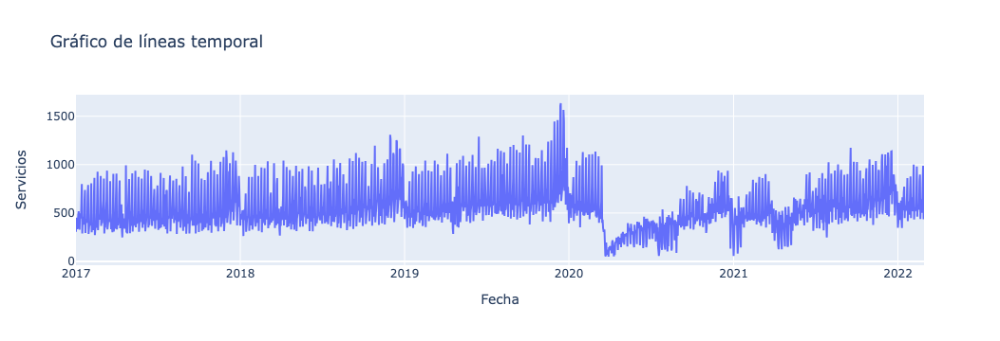

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index,y=df["y"],mode="lines",name="Servicios Prestados"))
fig.update_layout(title='Gráfico de líneas temporal',
                  xaxis_title='Fecha',
                  yaxis_title='Servicios')
fig.show()


## **Análisis de Estacionalidad**

In [12]:
X=df[["Fecha","y"]]
X.head()

,Fecha,y
Date,,
2017-01-01,2017-01-01,305
2017-01-02,2017-01-02,452
2017-01-03,2017-01-03,406
2017-01-04,2017-01-04,335
2017-01-05,2017-01-05,360


In [13]:
X["day"]=X.index.dayofweek
X["week"]=X.index.week
X["dayofyear"]=X.index.day_of_year
X["year"]=X.index.year
X["dayofmonth"]=X.index.day
X["month"]=X.index.month

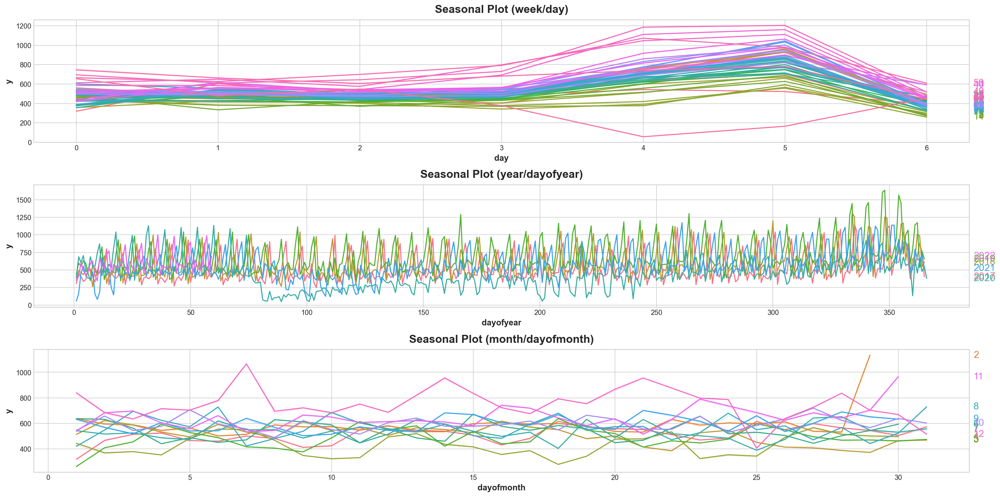

In [14]:
fig, (ax0, ax1,ax2) = plt.subplots(3, 1, figsize=(20, 10))
seasonal_plot(X, y="y", period="week", freq="day", ax=ax0)
seasonal_plot(X, y="y", period="year", freq="dayofyear", ax=ax1)
seasonal_plot(X, y="y", period="month", freq="dayofmonth",ax=ax2);

### **Ahora veamos el periodograma:**

El periodograma es una herramienta utilizada en el análisis de señales y series de tiempo para estimar la densidad espectral de potencia (DSP) o la distribución de energía en diferentes frecuencias presentes en una señal. Es una técnica comúnmente utilizada en el análisis de señales periódicas o cuasi periódicas.

En términos simples, el periodograma muestra cómo la energía de una señal está distribuida en el dominio de la frecuencia, lo que permite identificar patrones, tendencias o ciclos que pueden estar presentes en los datos.

El proceso para obtener un periodograma generalmente implica tomar una secuencia de muestras de la señal y luego calcular la transformada de Fourier de esas muestras. La transformada de Fourier convierte las señales del dominio del tiempo al dominio de la frecuencia, mostrando cómo las diferentes frecuencias contribuyen a la señal original. El cuadrado del módulo de la transformada de Fourier (o el cuadrado del valor absoluto) proporciona una estimación de la densidad espectral de potencia, que es la base del periodograma.

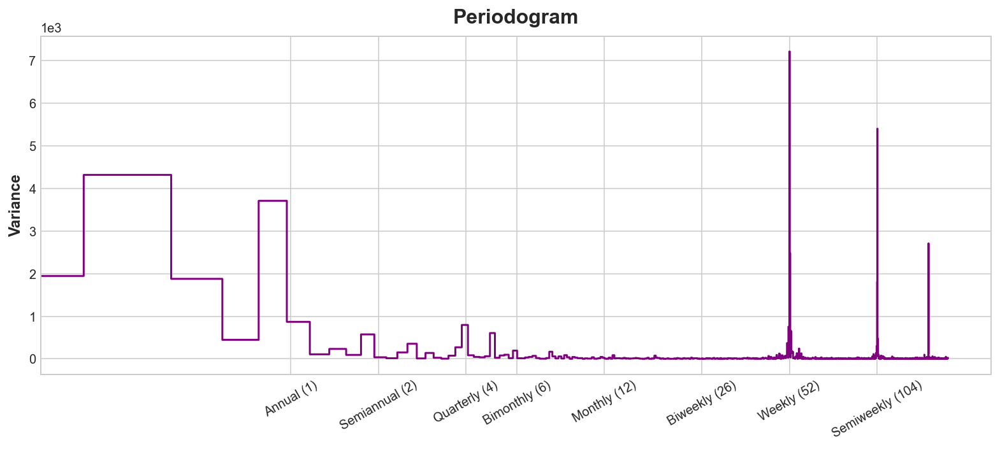

In [15]:
plot_periodogram(X.y);

In [16]:
X.head()

,Fecha,y,day,week,dayofyear,year,dayofmonth,month
Date,,,,,,,,
2017-01-01,2017-01-01,305,6,52,1,2017,1,1
2017-01-02,2017-01-02,452,0,1,2,2017,2,1
2017-01-03,2017-01-03,406,1,1,3,2017,3,1
2017-01-04,2017-01-04,335,2,1,4,2017,4,1
2017-01-05,2017-01-05,360,3,1,5,2017,5,1


In [17]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

In [18]:
y = df.y.copy()

In [19]:
fourier = CalendarFourier(freq='M', order=6)
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=True,
    additional_terms=[fourier],
    drop=True,
)

In [20]:
X = dp.in_sample()

In [21]:
X 

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=M)","cos(1,freq=M)","sin(2,freq=M)","cos(2,freq=M)","sin(3,freq=M)","cos(3,freq=M)","sin(4,freq=M)","cos(4,freq=M)","sin(5,freq=M)","cos(5,freq=M)","sin(6,freq=M)","cos(6,freq=M)"
Date,,,,,,,,,,,,,,,,,,,,
2017-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2017-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.201299,0.979530,0.394356,0.918958,0.571268,0.820763,0.724793,0.688967,0.848644,0.528964,0.937752,0.347305
2017-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.394356,0.918958,0.724793,0.688967,0.937752,0.347305,0.998717,-0.050649,0.897805,-0.440394,0.651372,-0.758758
2017-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.571268,0.820763,0.937752,0.347305,0.968077,-0.250653,0.651372,-0.758758,0.101168,-0.994869,-0.485302,-0.874347
2017-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.724793,0.688967,0.998717,-0.050649,0.651372,-0.758758,-0.101168,-0.994869,-0.790776,-0.612106,-0.988468,0.151428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-24,1.0,1881.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.900969,0.433884,-0.781831,-0.623490,0.222521,-0.974928,0.974928,-0.222521,0.623490,0.781831,-0.433884,0.900969
2022-02-25,1.0,1882.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.781831,0.623490,-0.974928,-0.222521,-0.433884,-0.900969,0.433884,-0.900969,0.974928,-0.222521,0.781831,0.623490
2022-02-26,1.0,1883.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.623490,0.781831,-0.974928,0.222521,-0.900969,-0.433884,-0.433884,-0.900969,0.222521,-0.974928,0.781831,-0.623490


In [22]:
from sklearn.linear_model import LinearRegression
model = LinearRegression().fit(X, y)

In [23]:
y_pred = pd.Series(
    model.predict(X),
    index=X.index,
    name='Fitted',
)

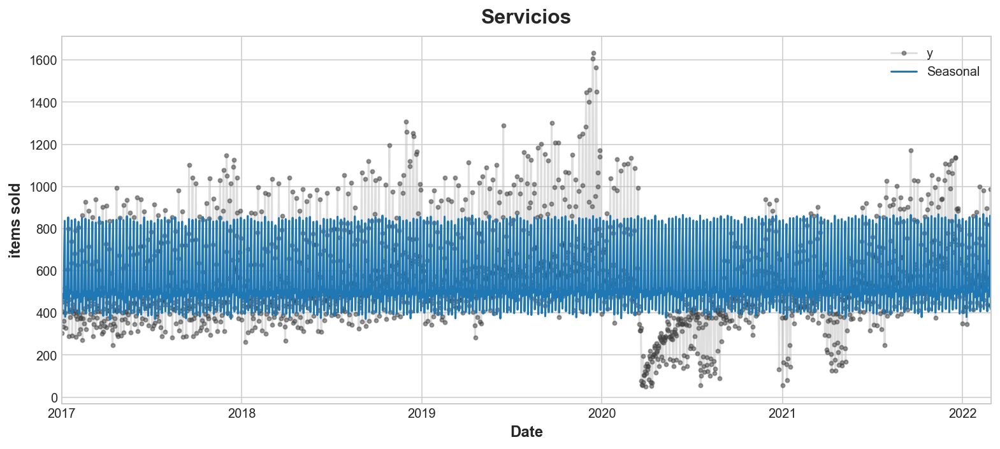

In [24]:
y_pred = pd.Series(model.predict(X), index=X.index)
ax = y.plot(**plot_params, alpha=0.5, title="Servicios", ylabel="items sold")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax.legend();

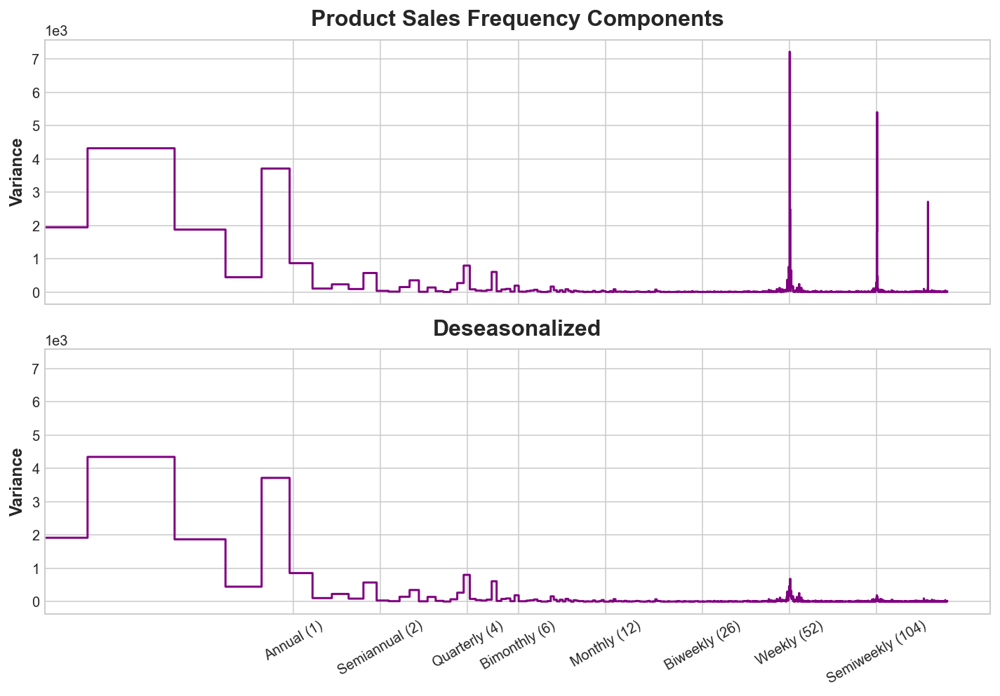

In [25]:
y_deseason = y - y_pred

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(10, 7))
ax1 = plot_periodogram(y, ax=ax1)
ax1.set_title("Product Sales Frequency Components")
ax2 = plot_periodogram(y_deseason, ax=ax2);
ax2.set_title("Deseasonalized");

**Aplicar Prophet para Evidenciar Estacionalidad**

In [26]:
df1=df[["Fecha","y"]]

In [27]:
df1.rename(columns={"Fecha":"ds"},inplace=True)
df1

,ds,y
Date,,
2017-01-01,2017-01-01,305
2017-01-02,2017-01-02,452
2017-01-03,2017-01-03,406
2017-01-04,2017-01-04,335
2017-01-05,2017-01-05,360
...,...,...
2022-02-24,2022-02-24,557
2022-02-25,2022-02-25,819
2022-02-26,2022-02-26,987


In [28]:
from prophet import Prophet

m = Prophet()
m.fit(df1)

prophet    INFO  Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
cmdstanpy  DEBUG input tempfile: /var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/0t9fwwd9.json
cmdstanpy  DEBUG input tempfile: /var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/hf8jszjd.json
cmdstanpy  DEBUG idx 0
cmdstanpy  DEBUG running CmdStan, num_threads: None
cmdstanpy  DEBUG CmdStan args: ['/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99373', 'data', 'file=/var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/0t9fwwd9.json', 'init=/var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/hf8jszjd.json', 'output', 'file=/var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/prophet_model_tvy5dzr/prophet_model-20230726202133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:21:33 - cmdstanpy - INFO - Chain [1] start processing
cmdstanpy  INFO  Cha

In [29]:
future = m.make_future_dataframe(periods=60)
forecast = m.predict(future)

In [30]:
from prophet.plot import plot_plotly, plot_components_plotly

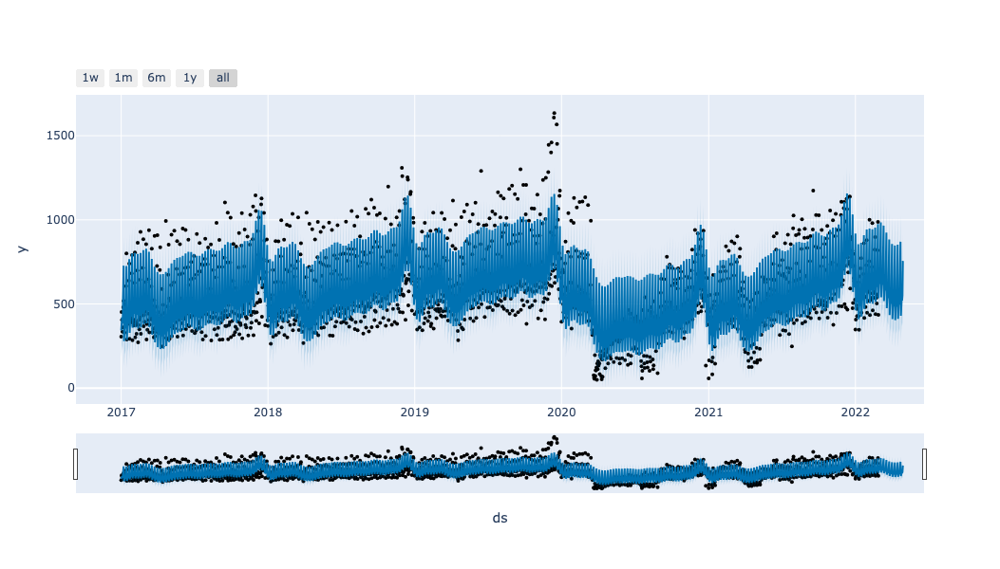

In [31]:
plot_plotly(m, forecast)

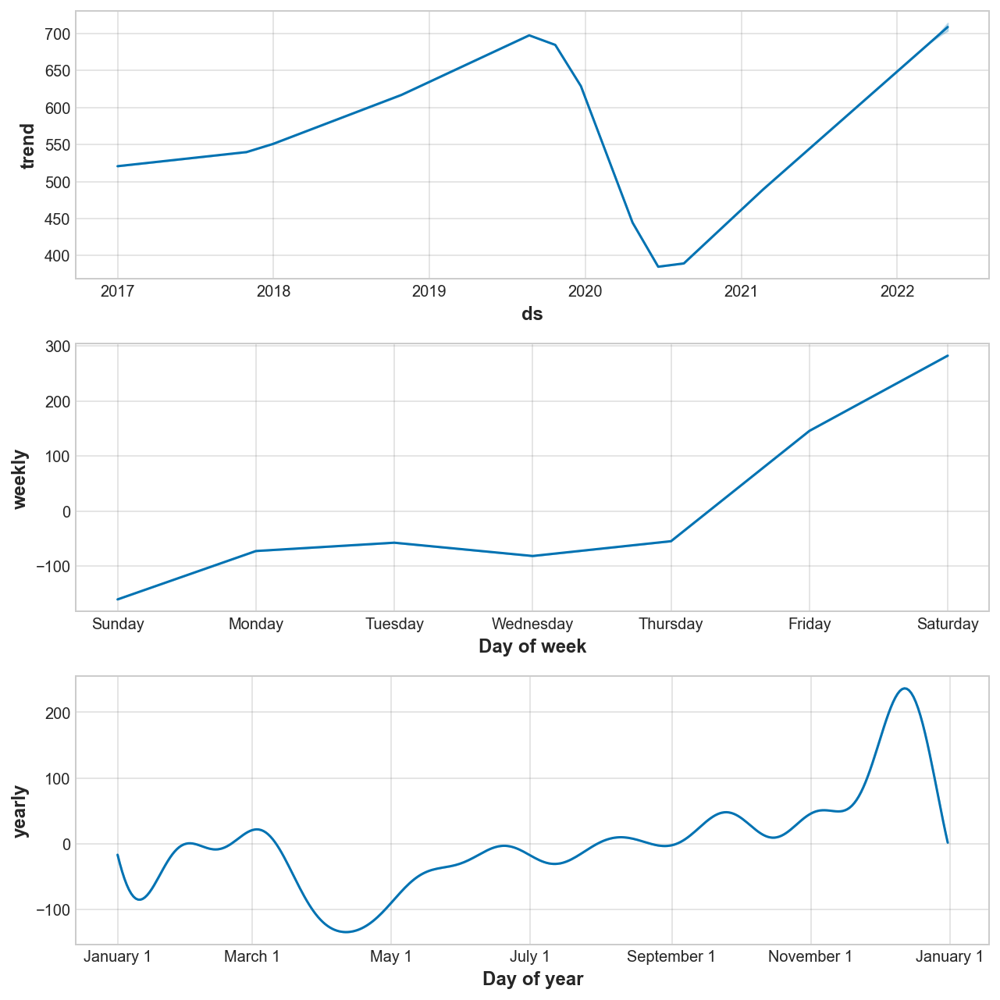

In [32]:
fig2 = m.plot_components(forecast)

Podemos evidenciar las siguientes estacionalidades:
* Anual: Se presta mas servcicios en Diciembre
* Se presta mas servicios los días Viernes y Sabado

# **2) Modelos**

**Separamos en Train y Test**

In [33]:
steps=60
datos_train=df.drop(columns=["Fecha"])[:-steps]
datos_test=df.drop(columns=["Fecha"])[-steps:]

In [34]:
datos_train.shape

(1825, 1)

In [35]:
datos_test.shape

(60, 1)

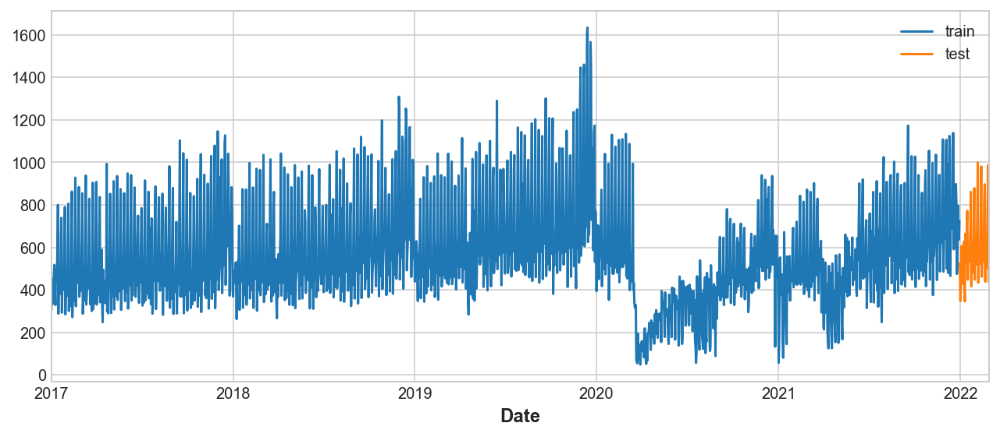

In [36]:
fig, ax = plt.subplots(figsize=(9, 4))
datos_train['y'].plot(ax=ax, label='train')
datos_test['y'].plot(ax=ax, label='test')
ax.legend();

## **ForecasterAutoreg**

In [37]:
model_rf= ForecasterAutoreg(regressor=RandomForestRegressor(random_state=123),
                           lags=30)

In [38]:
model_rf.fit(y=datos_train["y"])

In [39]:
model_rf

ForecasterAutoreg 
Regressor: RandomForestRegressor(random_state=123) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30] 
Window size: 30 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [0, 1824] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 123, 'verbose': 0, 'warm_start': False} 
Creation date: 2023-07-26 20:21:35 
Last fit date: 2023-07-26 20:21:37 
Skforecast version: 0.4.3 

**Predicciones**

In [40]:
Predicciones_rf=model_rf.predict(steps=steps)
Predicciones_rf

1825     959.60
1826     654.35
1827     557.47
1828     712.77
1829     674.65
1830     627.38
1831     801.29
1832     969.42
1833     625.19
1834     590.75
1835     691.68
1836     616.33
1837     636.83
1838     831.82
1839    1000.90
1840     574.19
1841     569.68
1842     628.19
1843     617.38
1844     622.12
1845     819.29
1846    1061.43
1847     555.50
1848     580.78
1849     644.08
1850     604.41
1851     628.31
1852     858.64
1853    1090.34
1854     573.26
1855     587.65
1856     621.46
1857     603.96
1858     632.18
1859     890.85
1860    1112.32
1861     560.32
1862     596.59
1863     631.26
1864     615.97
1865     632.43
1866     898.67
1867    1117.06
1868     549.03
1869     596.26
1870     637.50
1871     608.05
1872     631.94
1873     906.35
1874    1121.48
1875     560.63
1876     592.47
1877     635.89
1878     607.42
1879     631.11
1880     930.18
1881    1127.00
1882     543.74
1883     598.82
1884     640.04
Name: pred, dtype: float64

In [41]:
datos_test["Predicciones Rf"]= Predicciones_rf.values
datos_test.head()

,y,Predicciones Rf
Date,,
2021-12-31,525,959.60
2022-01-01,348,654.35
2022-01-02,407,557.47
2022-01-03,606,712.77
2022-01-04,492,674.65


**Evaluamos el Error**

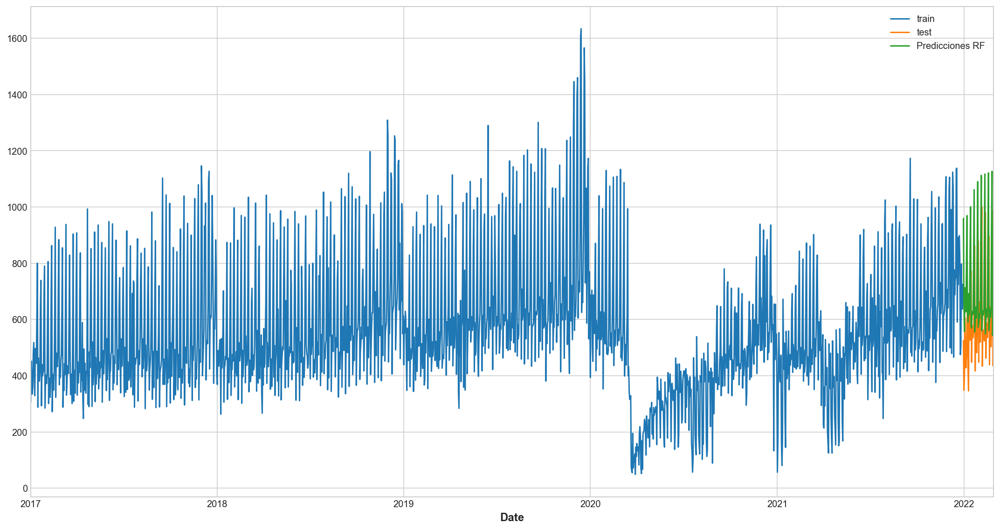

In [42]:
fig, ax = plt.subplots(figsize=(15, 8))
datos_train['y'].plot(ax=ax, label='train')
datos_test['y'].plot(ax=ax, label='test')
datos_test['Predicciones Rf'].plot(ax=ax, label='Predicciones RF')
ax.legend();

### **Error Train**

In [43]:
def MAPE(Y_actual,Y_Predicted):
    mape = np.mean(np.abs((Y_actual - Y_Predicted)/Y_actual))*100
    return mape

def rmse (actual, pred):
    actual, pred = np.array (actual), np.array (pred)
    return np.sqrt (np.square (np.subtract (actual, pred)). mean ())

### **Error Test**

In [44]:
Realidad=datos_test["y"]
Predicciones_Rf=datos_test["Predicciones Rf"]
Mape_Test_Rf=MAPE(Realidad,Predicciones_Rf)
print(Mape_Test_Rf)

34.81158590686327


In [45]:
RMSE_Test_RF=rmse(Realidad,Predicciones_Rf)
RMSE_Test_RF

243.81067957194438

In [46]:
datos_test.head()

,y,Predicciones Rf
Date,,
2021-12-31,525,959.60
2022-01-01,348,654.35
2022-01-02,407,557.47
2022-01-03,606,712.77
2022-01-04,492,674.65


### **Ajuste de hiperparámetros (tuning)**

forecaster = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123),
                lags      = 12 # Este valor será remplazado en el grid search
             )


lags_grid = [6,10,30]
## Hiperparámetros del regresor
param_grid = {'n_estimators': [50,100, 500],
              'max_depth': [3, 5, 7]}

resultados_grid = grid_search_forecaster(
                        forecaster         = forecaster,
                        y                  = datos_train['y'],
                        param_grid         = param_grid,
                        lags_grid          = lags_grid,
                        steps              = steps,
                        refit              = True,
                        metric             = 'mean_squared_error',
                        initial_train_size = int(len(datos_train)*0.5),
                        fixed_train_size   = False,
                        return_best        = True,
                        verbose            = False
                   )

In [47]:
#resultados_grid

In [48]:
regressor = RandomForestRegressor(max_depth=5, n_estimators=100, random_state=123)
model_opt = ForecasterAutoreg(
                regressor = regressor,
                lags      = 10
             )

model_opt.fit(y=datos_train['y'])

In [49]:
predicciones_rf1 = model_opt.predict(steps=steps)
datos_test["Predicciones RF1"]=predicciones_rf1.values

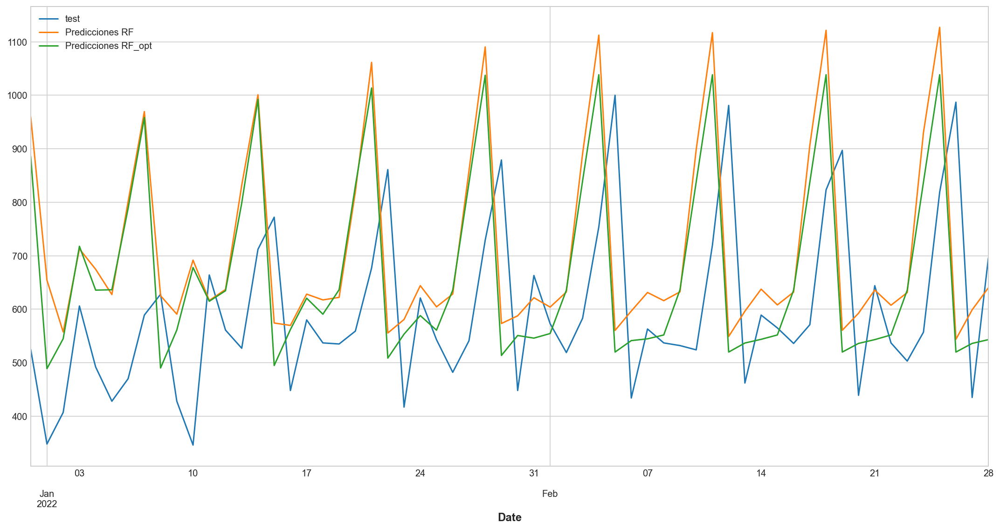

In [50]:
fig, ax = plt.subplots(figsize=(15, 8))
datos_test['y'].plot(ax=ax, label='test')
datos_test['Predicciones Rf'].plot(ax=ax, label='Predicciones RF')
datos_test['Predicciones RF1'].plot(ax=ax, label='Predicciones RF_opt')
ax.legend();

**Error Test**

In [58]:
Realidad=datos_test["y"]
Predicciones_Rf1=datos_test["Predicciones RF1"]
Mape_Test_Rf1=MAPE(Realidad,Predicciones_Rf1)
print(f'Mape: {Mape_Test_Rf1}')
RMSE_Test_RF1=rmse(Realidad,Predicciones_Rf1)
print(f'RMSE: {RMSE_Test_RF1}')

Mape: 31.203278173997955
RMSE: 227.66937198249389


## **XGB Boosting**

In [65]:
from xgboost import XGBRegressor

model_xgb = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 10
             )

model_xgb.fit(y=datos_train['y'])

In [66]:
predicciones_xgb = model_xgb.predict(steps=steps)
datos_test["Predicciones XGB"]=predicciones_xgb.values

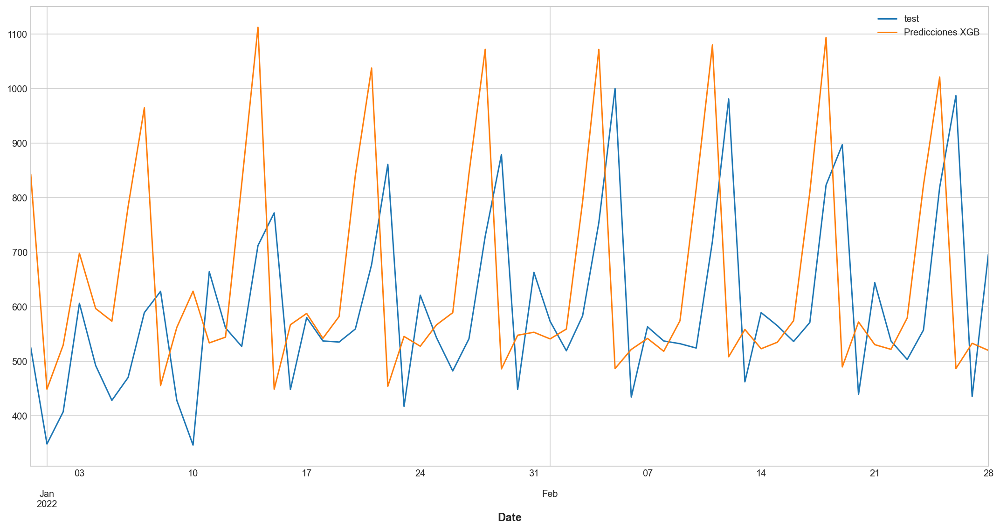

In [68]:
fig, ax = plt.subplots(figsize=(15, 8))
datos_test['y'].plot(ax=ax, label='test')
#datos_test['Predicciones Rf'].plot(ax=ax, label='Predicciones RF')
#datos_test['Predicciones RF1'].plot(ax=ax, label='Predicciones RF_opt')
datos_test['Predicciones XGB'].plot(ax=ax, label='Predicciones XGB')
ax.legend();

In [73]:
Realidad=datos_test["y"]
Predicciones_XGB=datos_test["Predicciones XGB"]

Mape_Test_XGB=MAPE(Realidad,Predicciones_XGB)
print(f'Mape: {Mape_Test_XGB}')
RMSE_Test_XGB=rmse(Realidad,Predicciones_XGB)
print(f'RMSE: {RMSE_Test_XGB}')

Mape: 30.32860782814371
RMSE: 235.69685914015886


### **Optimización del XGB**

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24
             )

param_grid = {
    'n_estimators': [100, 500],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01,0.05, 0.1]
}

lags_grid = [6, 15, 30]

resultados_grid = grid_search_forecaster(
        forecaster         = forecaster,
        y                  = datos_train['y'],
        param_grid         = param_grid,
        lags_grid          = lags_grid,
        steps              = steps,
        refit              = False,
        metric             = 'mean_squared_error',
        initial_train_size = int(len(datos_train)*0.5), 
        return_best        = True,
        verbose            = False
)

In [77]:
#resultados_grid

In [78]:
model_xgb_opt = ForecasterAutoreg(
                regressor = XGBRegressor(learning_rate=0.01,max_depth=5,n_estimators=500,random_state=123),
                lags = 30
             )

model_xgb_opt.fit(y=datos_train['y'])

In [79]:
predicciones_xgb_opt = model_xgb_opt.predict(steps=steps)
datos_test["Predicciones XGB1"]=predicciones_xgb_opt.values

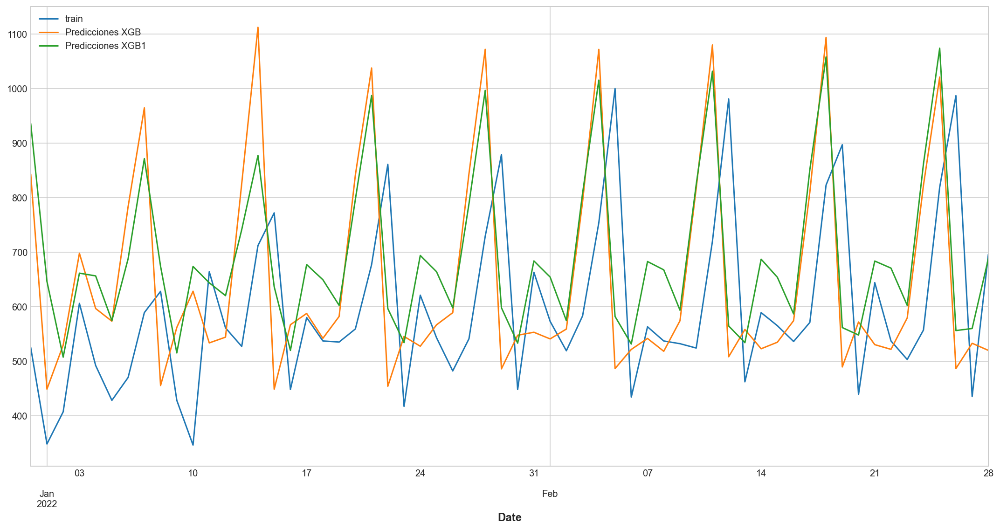

In [81]:
fig, ax = plt.subplots(figsize=(15, 8))
datos_test['y'].plot(ax=ax, label='train')
#datos_test['Predicciones Rf'].plot(ax=ax, label='Predicciones RF')
#datos_test['Predicciones RF1'].plot(ax=ax, label='Predicciones RF_opt')
datos_test['Predicciones XGB'].plot(ax=ax, label='Predicciones XGB')
datos_test['Predicciones XGB1'].plot(ax=ax, label='Predicciones XGB1')
ax.legend();

In [82]:
Realidad=datos_test["y"]
Predicciones_XGB1=datos_test["Predicciones XGB1"]

Mape_Test_XGB1=MAPE(Realidad,Predicciones_XGB1)
print(f'Mape: {Mape_Test_XGB1}')
RMSE_Test_XGB1=rmse(Realidad,Predicciones_XGB1)
print(f'RMSE: {RMSE_Test_XGB1}')

Mape: 29.247576725666125
RMSE: 206.6125075535068


## **Prophet**

In [95]:
df=datos_train[["y"]]
df["ds"]=df.index
df=df[["ds","y"]]
df.head()
df=df.reset_index(drop=True)

In [96]:
m = Prophet()
m.fit(df)

prophet    INFO  Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
cmdstanpy  DEBUG input tempfile: /var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/22j_f399.json
cmdstanpy  DEBUG input tempfile: /var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/13fxj3s4.json
cmdstanpy  DEBUG idx 0
cmdstanpy  DEBUG running CmdStan, num_threads: None
cmdstanpy  DEBUG CmdStan args: ['/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43828', 'data', 'file=/var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/22j_f399.json', 'init=/var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/13fxj3s4.json', 'output', 'file=/var/folders/vt/2t0v0kt92gj1_bvmhn234x6ng8b83c/T/tmpfrkswuuq/prophet_model4j93x79n/prophet_model-20230726203533.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:35:33 - cmdstanpy - INFO - Chain [1] start processing
cmdstanpy  INFO  Cha

In [99]:
future=m.make_future_dataframe(periods=steps)
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1880,2022-02-24,660.879468,503.943916,820.432507
1881,2022-02-25,865.657098,712.858424,1029.229179
1882,2022-02-26,1005.676267,845.572304,1179.606726
1883,2022-02-27,562.033049,407.298547,740.951069
1884,2022-02-28,649.549633,492.108860,820.465425


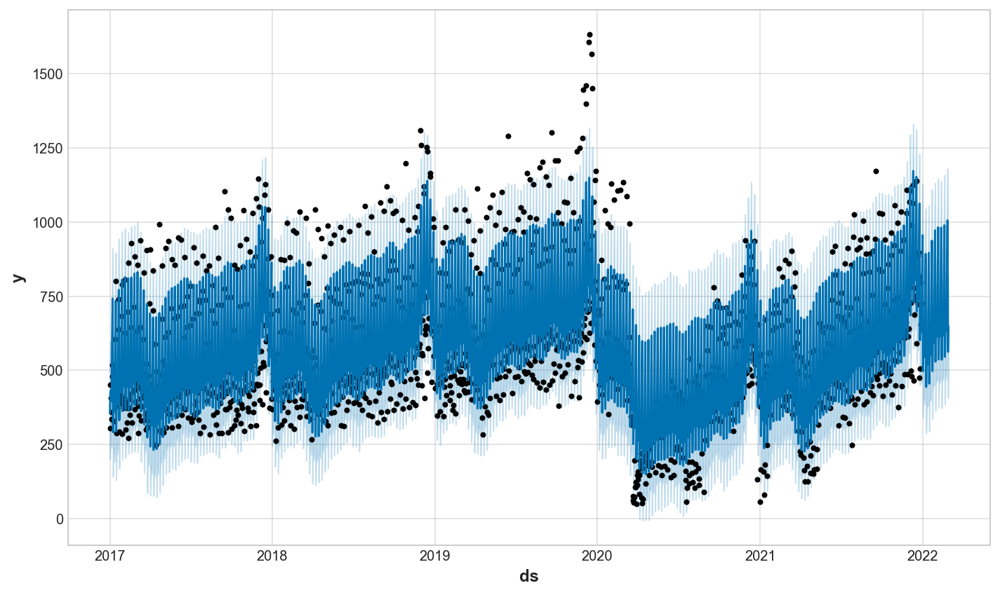

In [100]:
fig1 = m.plot(forecast)

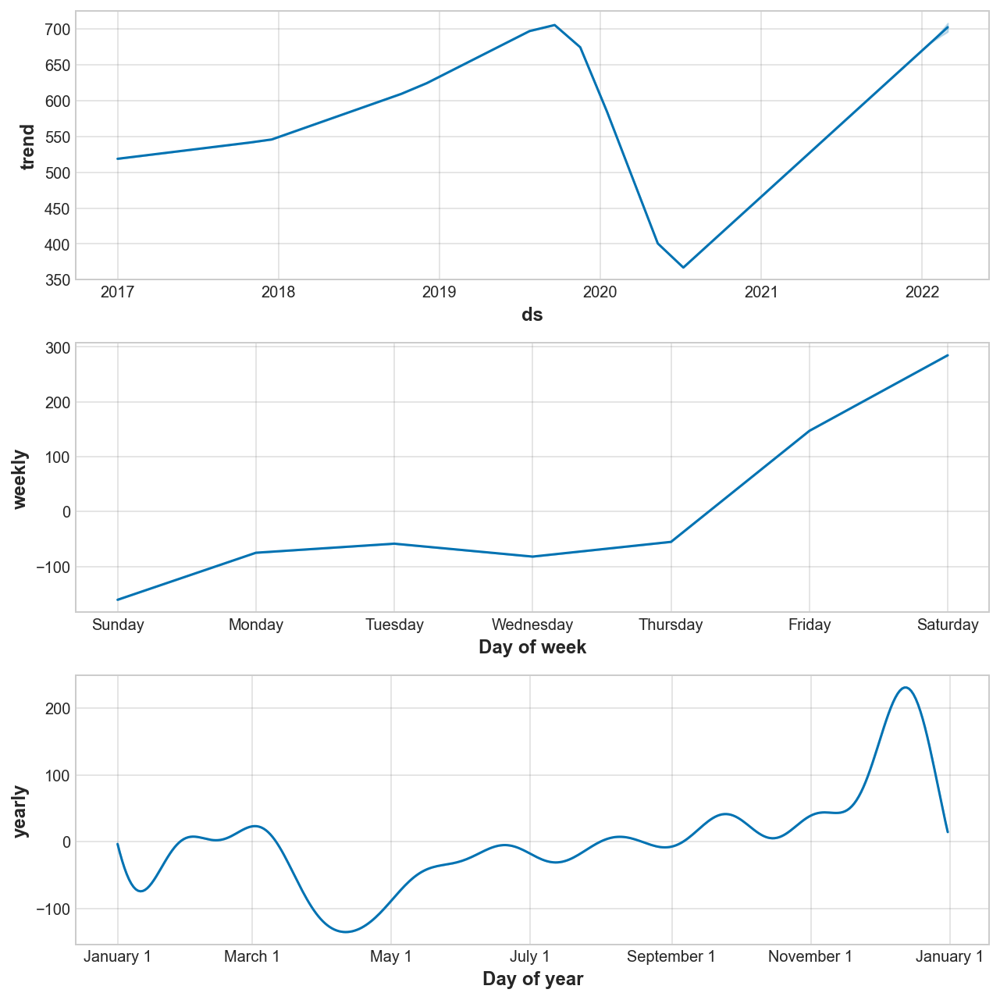

In [101]:
fig2 = m.plot_components(forecast)

In [105]:
Predicciones_FB=forecast[["ds","yhat"]][len(datos_train):]
datos_test["Predicciones Prophet"]=Predicciones_FB.yhat.values

In [107]:
datos_test.head()

,y,Predicciones Rf,Predicciones RF1,Predicciones XGB,Predicciones XGB1,Predicciones Prophet
Date,,,,,,
2021-12-31,525,959.60,885.850185,843.191406,935.868774,831.175701
2022-01-01,348,654.35,488.923768,448.643250,646.167786,955.179989
2022-01-02,407,557.47,544.814327,529.429993,507.328552,496.725553
2022-01-03,606,712.77,717.630690,697.895874,661.385681,570.839210
2022-01-04,492,674.65,635.650127,596.497131,656.351135,576.942153


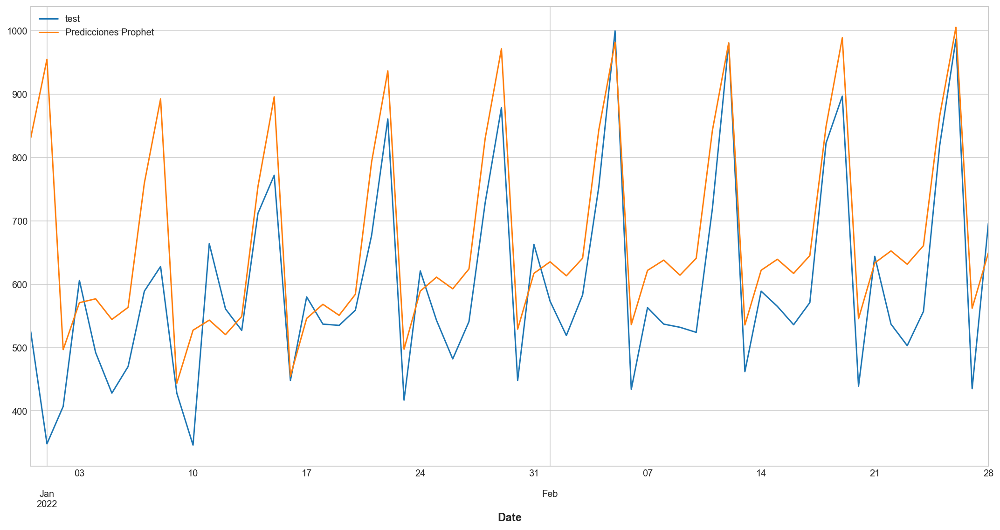

In [111]:
fig, ax = plt.subplots(figsize=(15, 8))
datos_test['y'].plot(ax=ax, label='test')
#datos_test['Predicciones Rf'].plot(ax=ax, label='Predicciones RF')
#datos_test['Predicciones RF1'].plot(ax=ax, label='Predicciones RF_opt')
#datos_test['Predicciones XGB'].plot(ax=ax, label='Predicciones XGB')
#datos_test['Predicciones XGB1'].plot(ax=ax, label='Predicciones XGB1')
datos_test['Predicciones Prophet'].plot(ax=ax, label='Predicciones Prophet')
ax.legend();

In [112]:
Realidad=datos_test["y"]
Predicciones_Prophet=datos_test["Predicciones Prophet"]

Mape_Test_Prophet=MAPE(Realidad,Predicciones_Prophet)
print(f'Mape: {Mape_Test_Prophet}')
RMSE_Test_Prophet=rmse(Realidad,Predicciones_Prophet)
print(f'RMSE: {RMSE_Test_Prophet}')

Mape: 17.450789413240784
RMSE: 125.10299154923385


## **Sarimax**

In [124]:
import statsmodels.api as sm 
from pylab import rcParams
# Stacionalidad no es deterministica

In [125]:
def Optimizacion_SARIMA(y):
    import itertools
    p=d=q=range(0,2)
    pdq=list(itertools.product(p,d,q))

    seasonal_pdq=[(x[0],x[1],x[2],12) for x in list(itertools.product(p,q,d))]

    p1=[]
    p2=[]
    p3=[]
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod=sm.tsa.statespace.SARIMAX(y,order=param,seasonal_order=param_seasonal,enforce_stationarity=False,enforce_invertibility=False)
                results=mod.fit()
                p1.append(param)
                p2.append(param_seasonal)
                p3.append(results.aic)
            except:
                continue
    df1 = pd.DataFrame({'param' : p1, 'param_seasonal' :p2,"results.aic":p3})
    td=df1[df1["results.aic"]==min(p3)]
    return td

In [126]:
td=Optimizacion_SARIMA(datos_train)

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.82118D+00    |proj g|=  6.75371D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   6.754D-07   7.821D+00
  F =   7.8211844755782209     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.6

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.81726D+00    |proj g|=  1.79065D-01

At iterate    5    f=  6.79841D+00    |proj g|=  5.79396D-03

At iterate   10    f=  6.75850D+00    |proj g|=  3.94651D-01

At iterate   15    f=  6.73805D+00    |proj g|=  5.84688D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     21      1     0     0   5.847D-07   6.738D+00
  F =   6.7380454852836564     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      1     14      1     0     0   2.080D-05   7.060D+00
  F =   7.0597543387966564     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.50506D+00    |proj g|=  1.38745D+01

At iterate    5    f=  6.84333D+00    |proj g|=  1.65955D-01

At iterate   10    f=  6.82976D+00    |proj g|=  4.41609D-03

At iterate   15    f=  6.82976D+00    |proj g|=  1.31856D-02

At iter

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.85600D+00    |proj g|=  2.00372D-01

At iterate    5    f=  6.75747D+00    |proj g|=  1.05817D-03

At iterate   10    f=  6.75682D+00    |proj g|=  4.08838D-02

At iterate   15    f=  6.73771D+00    |proj g|=  1.30689D-01

At iterate   20    f=  6.73317D+00    |proj g|=  2.26308D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     25      1     0     0   2.263D-06   6.733D+00
  F =   6.7331653315718833     

CONVERG

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.




At iterate    5    f=  7.50852D+00    |proj g|=  9.50761D-04

At iterate   10    f=  7.50846D+00    |proj g|=  1.26023D-02

At iterate   15    f=  7.50002D+00    |proj g|=  2.53780D-01

At iterate   20    f=  7.37865D+00    |proj g|=  4.73069D-02

At iterate   25    f=  7.37800D+00    |proj g|=  1.43734D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     25     28      1     0     0   1.437D-06   7.378D+00
  F =   7.3780014087985961     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.



At iterate    5    f=  7.39580D+00    |proj g|=  1.16089D-03

At iterate   10    f=  7.39426D+00    |proj g|=  3.13993D-02

At iterate   15    f=  7.27686D+00    |proj g|=  2.93357D-01

At iterate   20    f=  7.15850D+00    |proj g|=  3.00790D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     29      1     0     0   1.411D-05   7.158D+00
  F =   7.1584830555412555     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iter

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate   10    f=  7.02612D+00    |proj g|=  3.54499D-03

At iterate   15    f=  7.02576D+00    |proj g|=  1.04598D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     21      1     0     0   2.366D-06   7.026D+00
  F =   7.0257020921667079     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.78702D+00    |proj g|=  1.74768D-01


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.76130D+00    |proj g|=  1.64686D-03

At iterate   10    f=  6.76077D+00    |proj g|=  3.05409D-02

At iterate   15    f=  6.71223D+00    |proj g|=  2.74494D-01

At iterate   20    f=  6.67065D+00    |proj g|=  1.75638D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     26      1     0     0   5.096D-06   6.671D+00
  F =   6.6706442393750445     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.35834D+00    |proj g|=  6.06281D-02

At iterate    5    f=  7.35380D+00    |proj g|=  3.51827D-03

At iterate   10    f=  7.34474D+00    |proj g|=  4.55826D-02

At iterate   15    f=  7.07446D+00    |proj g|=  5.94680D-01

At iterate   20    f=  6.97407D+00    |proj g|=  3.47812D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     30      1     0     0   4.499D-06   6.974D+00
  F =   6.9740627498076773     

CONVERG

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  7.30822D+00    |proj g|=  1.79299D-02

At iterate   10    f=  7.30767D+00    |proj g|=  1.46936D-03

At iterate   15    f=  7.30760D+00    |proj g|=  1.86106D-02

At iterate   20    f=  7.29357D+00    |proj g|=  8.42228D-01

At iterate   25    f=  7.05765D+00    |proj g|=  3.27629D-01

At iterate   30    f=  6.75196D+00    |proj g|=  1.78346D+00

At iterate   35    f=  6.71558D+00    |proj g|=  1.59391D-01

At iterate   40    f=  6.71544D+00    |proj g|=  9.34430D-04



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     41     73      1     0     0   9.344D-04   6.715D+00
  F =   6.7154393011078790     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.86308D+00    |proj g|=  7.50047D-02

At iterate    5    f=  6.85880D+00    |proj g|=  3.10193D-03

At iterate   10    f=  6.85422D+00    |proj g|=  8.05157D-02

At iterate   15    f=  6.83058D+00    |proj g|=  3.58785D-03

       

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.76061D+00    |proj g|=  2.37609D-02

At iterate   10    f=  6.76003D+00    |proj g|=  4.29159D-03

At iterate   15    f=  6.75497D+00    |proj g|=  6.81750D-02

At iterate   20    f=  6.67185D+00    |proj g|=  7.97597D-02

At iterate   25    f=  6.66874D+00    |proj g|=  9.08003D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     26     30      1     0     0   2.403D-06   6.669D+00
  F =   6.6687393558560908     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.91326D+00    |proj g|=  3.66738D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   3.667D-06   6.913D+00
  F =   6.9132625758345636     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.8

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.98451D+00    |proj g|=  1.12440D-01

At iterate   10    f=  6.98262D+00    |proj g|=  1.49173D-03

At iterate   15    f=  6.98257D+00    |proj g|=  2.91382D-02

At iterate   20    f=  6.97263D+00    |proj g|=  5.05392D-01

At iterate   25    f=  6.85660D+00    |proj g|=  2.77611D-01

At iterate   30    f=  6.84005D+00    |proj g|=  1.84840D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     32     44      1     0     0   2.805D-06   6.840D+00
  F =   6.8400487205378067     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.83847D+00    |proj g|=  5.30669D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      0      1      0     0     0   5.307D-06   6.838D+00
  F =   6.8384683314883583     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.8

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.03602D+00    |proj g|=  1.83008D-01
  ys=-8.509E-03  -gs= 9.380E-02 BFGS update SKIPPED

At iterate    5    f=  6.85902D+00    |proj g|=  4.36120D-02

At iterate   10    f=  6.85750D+00    |proj g|=  7.65522D-03

At iterate   15    f=  6.85679D+00    |proj g|=  1.40976D-01

At iterate   20    f=  6.82174D+00    |proj g|=  3.10820D-01

At iterate   25    f=  6.80543D+00    |proj g|=  1.14256D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     56      1     1     0   3.608D-05   6.805D+00
  F =   6.8054271367951120     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.81469D+00    |proj g|=  1.99504D-01

At iterate    5    f=  6.71064D+00    |proj g|=  5.95858D-03

At iterate   10    f=  6.70919D+00    |proj g|=  1.06505D-01

At iterate   15    f=  6.69488D+00    |proj g|=  7.81564D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     25      1     0     0   7.208D-07   6.694D+00
  F =   6.6944390385215096     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.77050D+00    |proj g|=  2.88071D-01

At iterate    5    f=  6.62123D+00    |proj g|=  1.93829D-03

At iterate   10    f=  6.62107D+00    |proj g|=  2.67520D-02

At iterate   15    f=  6.60567D+00    |proj g|=  2.22851D-01

At iterate   20    f=  6.58723D+00    |proj g|=  1.99446D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     28      1     0     0   7.609D-07   6.587D+00
  F =   6.5872252638414137     

CONVERG

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


  ys=-2.530E-02  -gs= 1.228E-01 BFGS update SKIPPED

At iterate    5    f=  7.12105D+00    |proj g|=  1.19199D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      6     21      2     1     0   9.176D-04   7.121D+00
  F =   7.1210461054635408     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.00236D+00    |proj g|=  2.17139D-01

At iterate    5    f=  6.92201D+00    |proj g|=  3.63422D-01

At iterate   10    f=  6.89850D+00    |proj g|=  1.30234D-02

At iterate   15    f=  6.89841D+00    |proj g|=  1.41268D-02

At iterate   20    f=  6.89225D+00    |proj g|=  1.14877D-01

At iterate   25    f=  6.85548D+00    |proj g|=  2.23543D-01

At iterate   30    f=  6.62415D+00    |proj g|=  6.93560D-02

At iterate   35    f=  6.62385D+00    |proj g|=  3.61987D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.73649D+00    |proj g|=  1.77185D-01

At iterate    5    f=  6.65063D+00    |proj g|=  1.23280D-03

At iterate   10    f=  6.65040D+00    |proj g|=  3.87260D-02

At iterate   15    f=  6.63930D+00    |proj g|=  2.05750D-01

At iterate   20    f=  6.62651D+00    |proj g|=  1.16933D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     30      1     0     0   1.119D-07   6.626D+00
  F =   6.6264986708573534     

CONVERG

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.64504D+00    |proj g|=  4.69815D-02

At iterate   10    f=  6.61542D+00    |proj g|=  4.86558D-03

At iterate   15    f=  6.61518D+00    |proj g|=  1.57123D-02

At iterate   20    f=  6.59728D+00    |proj g|=  1.59744D-01

At iterate   25    f=  6.57812D+00    |proj g|=  3.76109D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     29     35      1     0     0   2.717D-06   6.578D+00
  F =   6.5781166680847285     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.06361D+00    |proj g|=  3.23824D-02

At iterate    5    f=  7.00199D+00    |proj g|=  5.35604D-02

At iterate   10    f=  7.00119D+00    |proj g|=  1.56808D-03

At iterate   15    f=  6.99125D+00    |proj g|=  1.01859D-01

At iterate   20    f=  6.90485D+00    |proj g|=  8.40625D-02

At iterate   25    f=  6.89949D+00    |proj g|=  1.67466D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     47      1     0     0   

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.05340D+00    |proj g|=  1.36865D-01

At iterate    5    f=  6.89291D+00    |proj g|=  6.27419D-02

At iterate   10    f=  6.88997D+00    |proj g|=  2.21005D-03

At iterate   15    f=  6.88880D+00    |proj g|=  2.29750D-02

At iterate   20    f=  6.79335D+00    |proj g|=  3.94386D-01

At iterate   25    f=  6.59706D+00    |proj g|=  2.32966D-01

At iterate   30    f=  6.59191D+00    |proj g|=  5.55139D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.89615D+00    |proj g|=  3.17955D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      1     16      1     0     0   3.180D-05   6.896D+00
  F =   6.8961493895910069     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.8

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.07057D+00    |proj g|=  5.12577D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      0      1      0     0     0   5.126D-06   7.071D+00
  F =   7.0705704402771330     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.8

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.42233D+00    |proj g|=  1.08460D+00

At iterate    5    f=  6.82697D+00    |proj g|=  8.35666D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     14      1     0     0   2.027D-04   6.826D+00
  F =   6.8264805158833664     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.86954D+00    |proj g|=  3.25024D-01

At iterate    5    f=  6.85040D+00    |proj g|=  3.86608D-01

At iterate   10    f=  6.77666D+00    |proj g|=  9.86662D-01

At iterate   15    f=  6.75326D+00    |proj g|=  9.15523D-01

At iterate   20    f=  6.74028D+00    |proj g|=  9.70224D-02

At iterate   25    f=  6.74027D+00    |proj g|=  9.74348D-04

At iterate   30    f=  6.74022D+00    |proj g|=  5.67769D-02

At iterate   35    f=  6.73813D+00    |proj g|=  2.65518D-01

At iterate   40    f=  6.72552D+00    |proj g|=  2.33060D-01

At iterate   45    f=  6.72389D+00    |proj g|=  1.70958D-01

At iterate   50    f=  6.72380D+00    |proj g|=  9.35489D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.88198D+00    |proj g|=  1.02306D-01

At iterate    5    f=  6.87291D+00    |proj g|=  7.54242D-03

At iterate   10    f=  6.85986D+00    |proj g|=  1.38088D-01

At iterate   15    f=  6.84384D+00    |proj g|=  9.48489D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     21      1     0     0   2.235D-07   6.844D+00
  F =   6.8438366665099855     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.85260D+00    |proj g|=  1.42723D-01

At iterate    5    f=  6.77236D+00    |proj g|=  2.11852D-02

At iterate   10    f=  6.77198D+00    |proj g|=  2.58174D-03

At iterate   15    f=  6.76569D+00    |proj g|=  4.88174D-02

At iterate   20    f=  6.67485D+00    |proj g|=  6.92739D-02

At iterate   25    f=  6.66788D+00    |proj g|=  3.09138D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     26     33      1     0     0   

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.82742D+00    |proj g|=  1.68448D-01

At iterate    5    f=  6.72747D+00    |proj g|=  3.59921D+00

At iterate   10    f=  6.71684D+00    |proj g|=  6.40325D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     30      1     0     0   3.564D-03   6.717D+00
  F =   6.7168417340550253     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.63576D+00    |proj g|=  1.86459D+00

At iterate   10    f=  6.62907D+00    |proj g|=  9.15418D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     12     23      1     0     0   1.476D-03   6.629D+00
  F =   6.6290506697722753     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.01353D+00    |proj g|=  1.40481D-01

At iterate    5    f=  6.99572D+00    |proj g|=  1.45700D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     20      1     0     0   3.096D-04   6.996D+00
  F =   6.9956304731295758     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 v

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.75796D+00    |proj g|=  2.78806D-03

At iterate   10    f=  6.75650D+00    |proj g|=  4.26983D-02

At iterate   15    f=  6.75566D+00    |proj g|=  5.49113D-03

At iterate   20    f=  6.74097D+00    |proj g|=  9.19161D-02

At iterate   25    f=  6.67457D+00    |proj g|=  1.10107D-02

At iterate   30    f=  6.67453D+00    |proj g|=  5.03277D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     30     36      1     0     0   5.033D-06   6.675D+00
  F =   6.6745307395997866     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.39897D+00    |proj g|=  1.11999D+00

At iterate    5    f=  6.76163D+00    |proj g|=  1.10455D+00

At iterate   10    f=  6.68472D+00    |proj g|=  2.78777D+00

At iterate   15    f=  6.65379D+00    |proj g|=  4.21342D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     16     33      1     0     0   3.125D-03   6.654D+00
  F =   6.6537855755041804     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.74712D+00    |proj g|=  1.92931D-01

At iterate   10    f=  6.68158D+00    |proj g|=  8.81763D+00

At iterate   15    f=  6.65947D+00    |proj g|=  8.78835D-02

At iterate   20    f=  6.65919D+00    |proj g|=  1.17718D-01

At iterate   25    f=  6.65861D+00    |proj g|=  8.25375D-02

At iterate   30    f=  6.65861D+00    |proj g|=  1.81284D-03

At iterate   35    f=  6.65855D+00    |proj g|=  1.25721D-01

At iterate   40    f=  6.65369D+00    |proj g|=  2.66310D+00

At iterate   45    f=  6.58738D+00    |proj g|=  3.37525D+00


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate   50    f=  6.58344D+00    |proj g|=  8.54556D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   8.546D-01   6.583D+00
  F =   6.5834379939420389     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.85600D+00    |proj g|=  5.73764D-02

At iterate    5    f=  6.85348D+00    |proj g|=  4.07823D-02

At iterate   10    f=  6.85197D+00    |proj g|=  9.69569D-04

At iter

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.82966D+00    |proj g|=  1.00799D-01

At iterate    5    f=  6.75779D+00    |proj g|=  1.43672D-02

At iterate   10    f=  6.75629D+00    |proj g|=  3.92310D-02

At iterate   15    f=  6.75244D+00    |proj g|=  1.64983D-03

At iterate   20    f=  6.75215D+00    |proj g|=  1.94894D-02

At iterate   25    f=  6.74178D+00    |proj g|=  4.25467D-02

At iterate   30    f=  6.67777D+00    |proj g|=  5.78273D-02

At iterate   35    f=  6.67499D+00    |proj g|=  5.07247D-03

At iterate   40    f=  6.67496D+00    |proj g|=  3.07625D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.87554D+00    |proj g|=  5.38698D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      0      1      0     0     0   5.387D-06   6.876D+00
  F =   6.8755439062879482     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.8

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.
/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.03313D+00    |proj g|=  2.24071D-01

At iterate    5    f=  6.97499D+00    |proj g|=  1.14567D-01

At iterate   10    f=  6.97208D+00    |proj g|=  2.21524D-02

At iterate   15    f=  6.97197D+00    |proj g|=  8.81509D-03

At iterate   20    f=  6.97118D+00    |proj g|=  8.63142D-02

At iterate   25    f=  6.95493D+00    |proj g|=  2.41144D-01

At iterate   30    f=  6.80723D+00    |proj g|=  1.70045D-01

At iterate   35    f=  6.80317D+00    |proj g|=  3.79023D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.77937D+00    |proj g|=  7.15150D-02

At iterate    5    f=  6.77256D+00    |proj g|=  2.61483D-03

At iterate   10    f=  6.77124D+00    |proj g|=  3.04112D-02

At iterate   15    f=  6.76893D+00    |proj g|=  7.99938D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     18      1     0     0   7.999D-06   6.769D+00
  F =   6.7689311949411355     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate   10    f=  6.74722D+00    |proj g|=  1.21730D-03

At iterate   15    f=  6.74720D+00    |proj g|=  3.69245D-03

At iterate   20    f=  6.74574D+00    |proj g|=  4.41265D-02

At iterate   25    f=  6.73916D+00    |proj g|=  3.17710D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     28     31      1     0     0   6.859D-06   6.739D+00
  F =   6.7391406244091963     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  7.07543D+00    |proj g|=  7.36103D-03

At iterate   10    f=  7.06934D+00    |proj g|=  1.02731D-01

At iterate   15    f=  7.02532D+00    |proj g|=  5.61485D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     20      1     0     0   3.714D-07   7.025D+00
  F =   7.0253070064790366     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *



/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.07329D+00    |proj g|=  1.37542D-01

At iterate    5    f=  6.95041D+00    |proj g|=  2.42220D-02

At iterate   10    f=  6.94958D+00    |proj g|=  3.16405D-03

At iterate   15    f=  6.94819D+00    |proj g|=  5.42725D-02

At iterate   20    f=  6.89500D+00    |proj g|=  2.50172D-01

At iterate   25    f=  6.74282D+00    |proj g|=  1.77607D-01

At iterate   30    f=  6.74114D+00    |proj g|=  1.07214D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     31     45     

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.73810D+00    |proj g|=  3.46950D-01

At iterate    5    f=  6.70436D+00    |proj g|=  4.24356D-02

At iterate   10    f=  6.70431D+00    |proj g|=  4.39385D-03

At iterate   15    f=  6.70421D+00    |proj g|=  6.38809D-02

At iterate   20    f=  6.69600D+00    |proj g|=  3.27067D-01

At iterate   25    f=  6.67839D+00    |proj g|=  1.23864D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     35      1     0     0   

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.63759D+00    |proj g|=  2.26216D-02

At iterate   10    f=  6.63718D+00    |proj g|=  5.47440D-03

At iterate   15    f=  6.63381D+00    |proj g|=  5.44720D-02

At iterate   20    f=  6.58470D+00    |proj g|=  3.15245D-02

At iterate   25    f=  6.58400D+00    |proj g|=  2.94985D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     26     31      1     0     0   2.160D-06   6.584D+00
  F =   6.5840015770830069     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  7.10998D+00    |proj g|=  7.48342D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     22      1     0     0   9.673D-04   7.110D+00
  F =   7.1099141520302007     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.99474D+00    |proj g|=  2.09902D-01


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.90349D+00    |proj g|=  2.20741D-01

At iterate   10    f=  6.89278D+00    |proj g|=  9.07105D-03

At iterate   15    f=  6.89259D+00    |proj g|=  5.42882D-03

At iterate   20    f=  6.89150D+00    |proj g|=  1.15225D-01

At iterate   25    f=  6.73663D+00    |proj g|=  4.53178D-01

At iterate   30    f=  6.62021D+00    |proj g|=  2.58840D-01

At iterate   35    f=  6.60778D+00    |proj g|=  2.68249D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     37     52      1     0     0   3.840D-05   6.608D+00
  F =   6.6077796779190745     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.66947D+00    |proj g|=  2.99266D-01

At iterate    5    f=  6.64857D+00    |proj g|=  2.28304D-02

At iterate   10    f=  6.64819D+00    |proj g|=  2.82000D-03

At iterate   15    f=  6.64811D+00    |proj g|=  5.25077D-02

At iterate   20    f=  6.63902D+00    |proj g|=  4.96198D-01

At iterate   25    f=  6.60999D+00    |proj g|=  3.14500D-02

At iterate   30    f=  6.60946D+00    |proj g|=  1.59414D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.64819D+00    |proj g|=  1.78008D-02

At iterate   10    f=  6.63317D+00    |proj g|=  1.59076D-01

At iterate   15    f=  6.63196D+00    |proj g|=  1.67121D-03

At iterate   20    f=  6.63185D+00    |proj g|=  3.61896D-02

At iterate   25    f=  6.61950D+00    |proj g|=  3.74458D-01

At iterate   30    f=  6.57429D+00    |proj g|=  4.01586D-02

At iterate   35    f=  6.57396D+00    |proj g|=  1.08512D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     47      1     0     0   1.762D-05   6.574D+00
  F =   6.5739600315445301     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.



At iterate    5    f=  6.97620D+00    |proj g|=  4.02685D-01

At iterate   10    f=  6.97128D+00    |proj g|=  2.65118D-02

At iterate   15    f=  6.97127D+00    |proj g|=  4.06206D-03

At iterate   20    f=  6.97122D+00    |proj g|=  5.68092D-02

At iterate   25    f=  6.96448D+00    |proj g|=  1.65283D-01

At iterate   30    f=  6.88192D+00    |proj g|=  3.28933D-01

At iterate   35    f=  6.84192D+00    |proj g|=  4.61760D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     39     68      1     0     0   2.019D-04   6.842D+00
  F =   6.8418914628090652     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.04458D+00    |proj g|=  1.28615D-01

At iterate    5    f=  6.88613D+00    |proj g|=  2.40544D-02

At iterate   10    f=  6.88490D+00    |proj g|=  2.74779D-03

At iterate   15    f=  6.88390D+00    |proj g|=  1.90166D-02

At iterate   20    f=  6.83326D+00    |proj g|=  5.18347D-01

At iterate   25    f=  6.58390D+00    |proj g|=  1.72166D-01

At iterate   30    f=  6.57820D+00    |proj g|=  2.78325D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

In [127]:
td

,param,param_seasonal,results.aic
61,"(1, 1, 1)","(1, 0, 1, 12)",24004.954115


In [128]:
mododelo_Accion=sm.tsa.statespace.SARIMAX(datos_train,
                              order=(1,1 ,1),
                              seasonal_order=(1,0,1,12),
                              enforce_stationarity=False,
                              enforce_invertibility=False)


/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/Users/osgaspar/opt/anaconda3/envs/Personal/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [129]:
resultados=mododelo_Accion.fit()

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.69515D+00    |proj g|=  3.45945D-01

At iterate    5    f=  6.64819D+00    |proj g|=  1.78008D-02

At iterate   10    f=  6.63317D+00    |proj g|=  1.59076D-01

At iterate   15    f=  6.63196D+00    |proj g|=  1.67121D-03

At iterate   20    f=  6.63185D+00    |proj g|=  3.61896D-02

At iterate   25    f=  6.61950D+00    |proj g|=  3.74458D-01

At iterate   30    f=  6.57429D+00    |proj g|=  4.01586D-02

At iterate   35    f=  6.57396D+00    |proj g|=  1.08512D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

In [130]:
print(resultados.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1019      0.027      3.722      0.000       0.048       0.156
ma.L1         -1.1145      0.016    -70.948      0.000      -1.145      -1.084
ar.S.L12       0.2740      0.056      4.885      0.000       0.164       0.384
ma.S.L12      -0.6549      0.041    -16.044      0.000      -0.735      -0.575
sigma2      2.686e+04   1129.641     23.773      0.000    2.46e+04    2.91e+04


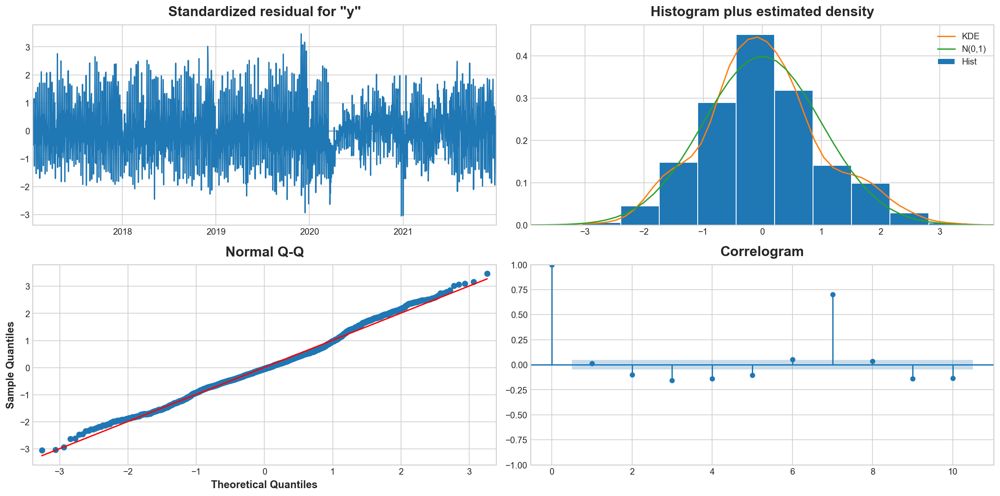

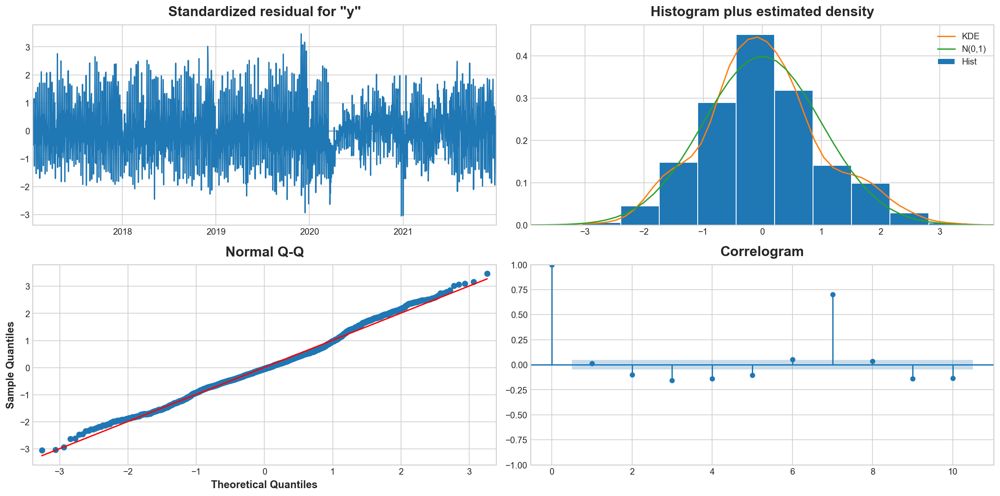

In [131]:
resultados.plot_diagnostics(figsize=(16,8))

**Predicciones**

In [132]:
Pred_uc=resultados.get_forecast(steps=steps)

In [134]:
#Pred_uc.predicted_mean

In [135]:
datos_test["Prediccion SARIMA"]=Pred_uc.predicted_mean.values

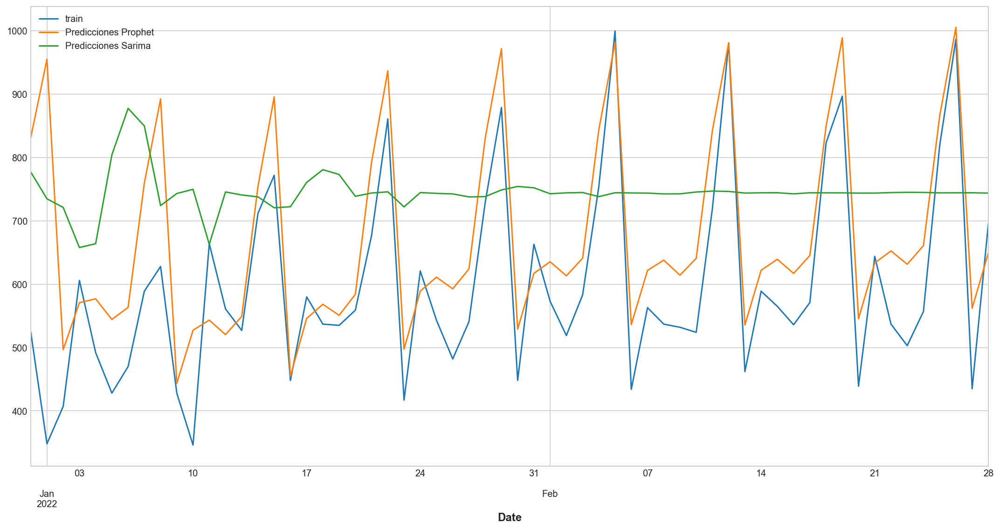

In [137]:
fig, ax = plt.subplots(figsize=(15, 8))
datos_test['y'].plot(ax=ax, label='train')
#datos_test['Predicciones Rf'].plot(ax=ax, label='Predicciones RF')
#datos_test['Predicciones RF1'].plot(ax=ax, label='Predicciones RF_opt')
#datos_test['Predicciones XGB'].plot(ax=ax, label='Predicciones XGB')
#datos_test['Predicciones XGB1'].plot(ax=ax, label='Predicciones XGB1')
datos_test['Predicciones Prophet'].plot(ax=ax, label='Predicciones Prophet')
datos_test["Prediccion SARIMA"].plot(ax=ax, label='Predicciones Sarima')
ax.legend();

In [138]:
Realidad=datos_test["y"]
Predicciones_Sarima=datos_test["Prediccion SARIMA"]

Mape_Test_Sarima=MAPE(Realidad,Predicciones_Sarima)
print(f'Mape: {Mape_Test_Sarima}')
RMSE_Test_Sarima=rmse(Realidad,Predicciones_Sarima)
print(f'RMSE: {RMSE_Test_Sarima}')

Mape: 37.60980209761507
RMSE: 218.1743720497421


# **Comparación de Modelos**

In [139]:
Modelos=["Rf","Rf Opt","XGB","XGB_OPT","Prophet","Sarima"]
Mape_Test=[Mape_Test_Rf,Mape_Test_Rf1,Mape_Test_XGB,Mape_Test_XGB1,Mape_Test_Prophet,Mape_Test_Sarima]
RMSE_Test=[RMSE_Test_RF,RMSE_Test_RF1,RMSE_Test_XGB,RMSE_Test_XGB1,RMSE_Test_Prophet,RMSE_Test_Sarima]

In [140]:
Resultados=pd.DataFrame({"Modelos":Modelos,"Mape Test":Mape_Test,"RMSE_Test":RMSE_Test})

In [141]:
Resultados.sort_values("Mape Test",ascending=True)

,Modelos,Mape Test,RMSE_Test
4,Prophet,17.450789,125.102992
3,XGB_OPT,29.247577,206.612508
2,XGB,30.328608,235.696859
1,Rf Opt,31.203278,227.669372
0,Rf,34.811586,243.810680
5,Sarima,37.609802,218.174372


In [119]:
#datos_test.describe()